In [1]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import ResNet50

from keras.models import Sequential, Model
from PIL import Image
from skimage import transform
import os
import random
import matplotlib.pyplot as plt
import numpy as np
from keras.utils import plot_model
from sklearn.metrics import classification_report, confusion_matrix
from collections import Counter
import itertools
import cv2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11char_traitsIcEENS_14SourceLocationE']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unable to open file: l

In [2]:
train_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/train/'
valid_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/val/'
test_folders = '/kaggle/input/chest-xray-pneumonia/chest_xray/test/'

In [3]:
photo_size=299

In [4]:
def prepare_dataset(data_dir):
    datagen = ImageDataGenerator(
        rescale= 1./255,
        rotation_range=40,
        width_shift_range=.2,
        height_shift_range=.2,
        shear_range=.1,
        zoom_range=.2,
        horizontal_flip=True,
        fill_mode='nearest',
    )
    generator = datagen.flow_from_directory(
        data_dir,
        shuffle=True,
        color_mode = "rgb",
        target_size=(photo_size,photo_size),
        class_mode='binary',
        batch_size=128,
        classes=['NORMAL','PNEUMONIA']
    )
    return generator

In [5]:
train_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/train/')
validation_generator = prepare_dataset('../input/chest-xray-pneumonia/chest_xray/val/')
test_generator=prepare_dataset('../input/chest-xray-pneumonia/chest_xray/test/')

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.
Found 624 images belonging to 2 classes.


In [6]:
validation_generator.class_indices

{'NORMAL': 0, 'PNEUMONIA': 1}

In [7]:
def show_few_images(number_of_examples=6, models=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(test_folders)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(test_folders)):
        
        image_ids = os.listdir(os.path.join(test_folders,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            path = os.path.join(test_folders,folder,image_ids[j])
            
            display = plt.imread(path)
            plt.axis('off')
            figure1.tight_layout()
            ax1[axs].imshow(display)
            title = 'True: '+folder

            if(models):
                for model in models:
                    if (model==efficientnetb0):
                        img = cv2.resize(cv2.imread(path),(299,299))
                        img_normalized = img/255
                        image_efficientnetb0_prediction = efficientnetb0.predict(np.array([img_normalized])).argmax()
                        if (image_efficientnetb0_prediction==1):
                            title = title+"\nresnet50 Prediction: PNEUMONIA"
                        else:
                            title = title+"\nresnet50 Prediction: NORMAL"
            ax1[axs].set_title(title)
            axs=axs+1

/tmp/ipykernel_23/102949159.py:15: UserWarning: The figure layout has changed to tight
  figure1.tight_layout()


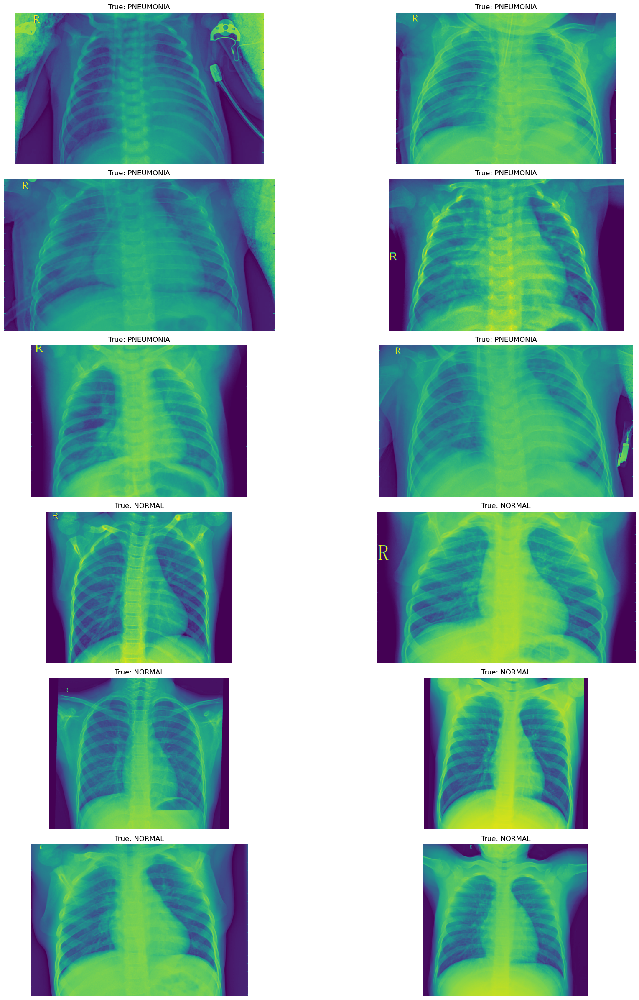

In [8]:
show_few_images()

In [9]:
epochs = 100

In [10]:
EfficientNetB0_model = ResNet50(weights = 'imagenet', include_top = False, input_shape = (299,299, 3))
for layer in EfficientNetB0_model.layers:
    layer.trainable = False
efficientnetb0_x = Flatten()(EfficientNetB0_model.output)
efficientnetb0_x = Dense(512, activation='relu')(efficientnetb0_x)
efficientnetb0_x = Dense(256, activation='relu')(efficientnetb0_x)
efficientnetb0_x = Dropout(0.5)(efficientnetb0_x)
efficientnetb0_x = Dense(2, activation = 'sigmoid')(efficientnetb0_x)
efficientnetb0 = Model(inputs=EfficientNetB0_model.input, outputs=efficientnetb0_x)
efficientnetb0.summary()

94765736/94765736 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 299, 299, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 305, 305, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 150, 150, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                             

In [11]:
efficientnetb0.compile(loss = 'sparse_categorical_crossentropy', optimizer = Adam(learning_rate=0.001), metrics=['accuracy'])

history_efficientnetb0 = efficientnetb0.fit(
    train_generator,
    epochs = epochs,
    validation_data = validation_generator
    )
efficientnetb0.save("EfficientNetB0_100.h5")

Epoch 1/100
41/41 [==============================] - 228s 5s/step - loss: 11.1213 - accuracy: 0.6355 - val_loss: 1.7313 - val_accuracy: 0.5625
Epoch 2/100
41/41 [==============================] - 163s 4s/step - loss: 0.5905 - accuracy: 0.7533 - val_loss: 0.8698 - val_accuracy: 0.6250
Epoch 3/100
41/41 [==============================] - 163s 4s/step - loss: 0.4451 - accuracy: 0.7751 - val_loss: 1.6327 - val_accuracy: 0.5625
Epoch 4/100
41/41 [==============================] - 160s 4s/step - loss: 0.4239 - accuracy: 0.7974 - val_loss: 1.3821 - val_accuracy: 0.6250
Epoch 5/100
41/41 [==============================] - 160s 4s/step - loss: 0.4088 - accuracy: 0.8027 - val_loss: 0.9872 - val_accuracy: 0.6875
Epoch 6/100
41/41 [==============================] - 161s 4s/step - loss: 0.4283 - accuracy: 0.7970 - val_loss: 0.8500 - val_accuracy: 0.6250
Epoch 7/100
41/41 [==============================] - 160s 4s/step - loss: 0.3769 - accuracy: 0.8263 - val_loss: 1.4615 - val_accuracy: 0.5625
Epoch

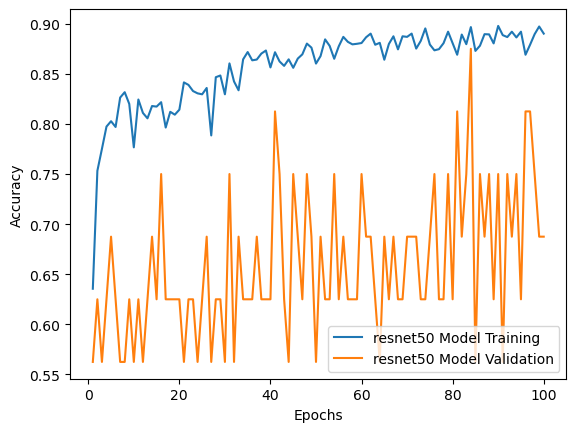

In [12]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.plot(x, history_efficientnetb0.history['accuracy'], label = "resnet50 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb0.history['val_accuracy'], label = "resnet50 Model Validation", linestyle="-")
plt.legend()
plt.show()

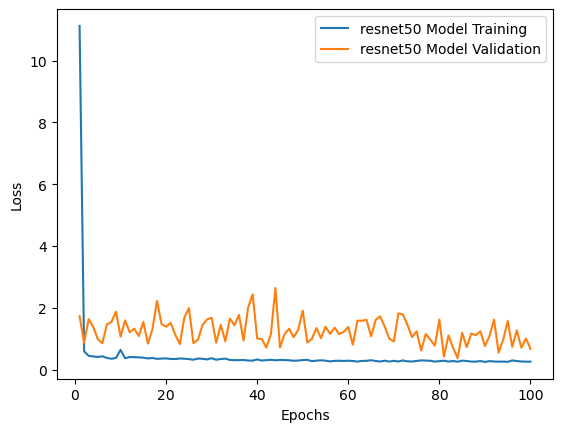

In [13]:
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# create data
x=[]
for i in range(1,(epochs+1)):
    x.append(i)

# plot lines
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.plot(x, history_efficientnetb0.history['loss'], label = "resnet50 Model Training", linestyle="-")
plt.plot(x, history_efficientnetb0.history['val_loss'], label = "resnet50 Model Validation", linestyle="-")
plt.legend()
plt.show()

In [14]:
true_value = []
pred_efficientnetb0 = []

for folder in os.listdir(test_folders):
    
    test_image_ids = os.listdir(os.path.join(test_folders,folder))
    
    for image_id in test_image_ids[:int(len(test_image_ids))]:
        
        path = os.path.join(test_folders,folder,image_id)
        
        true_value.append(test_generator.class_indices[folder])
        img = cv2.resize(cv2.imread(path),(299,299))
        img_normalized = img/255
        
        image_efficientnetb0_prediction = efficientnetb0.predict(np.array([img_normalized])).argmax()
        pred_efficientnetb0.append(image_efficientnetb0_prediction)
        
print(true_value)
print(pred_efficientnetb0)

1/1 [==============================] - 0s 25ms/step
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [15]:
from sklearn.metrics import confusion_matrix
import itertools
def clf_report(true_value, model_pred):
    classes = test_generator.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)

    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass

    print(classification_report(true_value, model_pred, target_names = list(classes)))

Model Accuracy 0.8285256410256411
              precision    recall  f1-score   support

      NORMAL       0.89      0.62      0.73       234
   PNEUMONIA       0.81      0.95      0.87       390

    accuracy                           0.83       624
   macro avg       0.85      0.79      0.80       624
weighted avg       0.84      0.83      0.82       624



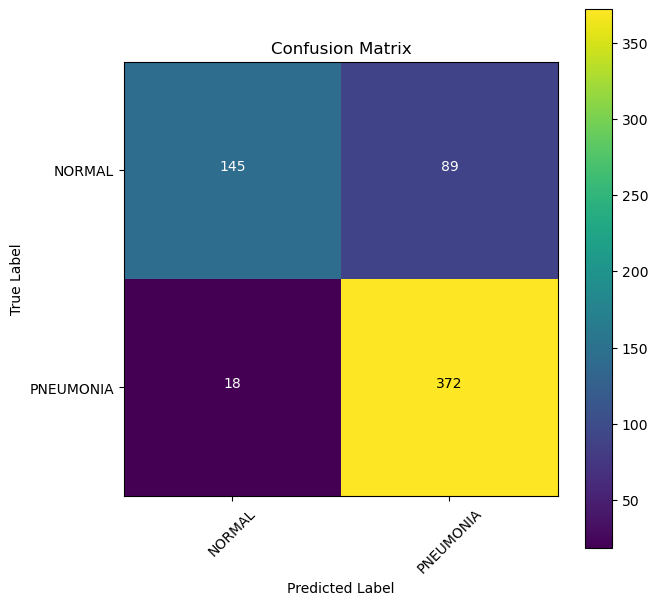

In [16]:
clf_report(true_value, pred_efficientnetb0)

In [17]:
models = [efficientnetb0]

1/1 [==============================] - 0s 31ms/step


/tmp/ipykernel_23/102949159.py:15: UserWarning: The figure layout has changed to tight
  figure1.tight_layout()


1/1 [==============================] - 0s 28ms/step


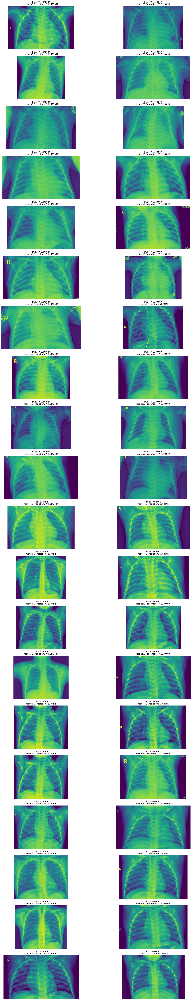

In [18]:
show_few_images(20, models)